# Univariate Analysis


#### Definition: Focuses on analyzing a single variable at a time.

#### Purpose: To understand the variable's distribution, central tendency, and spread.

####  we analyze a single variable, this method does not explore: Relationships, Interactions, Correlations and Causes
#### Why Univariate Analysis Is Important:
     it helps us understand:
     Distribution Shapes: Data Skewed or symmetric
     Central Tendency: Mean, Median, Mode
     Spread/ Variability: Range, IQR, Standard Deviation
     Outliers: Extreme values that need to be cleaned or transformed
     Class Imbalance(Categorical Variable) : Which category dominate or which category are rare?
     Data Quality: Missing Values, Invalid values, or unexpected patterns.     

#### Numerical Variable
     Techniques: Descriptive Statistics (Min, Max, Mean, Mode, Median, Range, Standard Deviation, Quantitles, skewness)
      
     Visualizations :  Histogram, Box plot, Density Plot
      
     Examples: age, hours_per_week
     
#### Categorical Variable
     Techniques: Frequency Count, Frequency Percentage 
     
     Visualizations : Pie Chart and Bar Chart
    
     Examples: workclass, marital_status, occupation, sex

#### Limitations:
####      1. Only One Variable at a Time
     
         Cannot detect multicollinearity

         Cannot detect interactions

####     2. No Context
        A variable may look normal alone but behave differently when combined with others.
        
      Example:

        Age distribution looks normal

        But age vs income may show a strong pattern

####    3. Not Enough for Decision‑Making
    
      You cannot make business or modeling decisions based only on univariate results.

      It must be combined with bivariate and multivariate analysis.

####    4. Limited for Categorical Variables
    
      Bar charts show frequency but not relationships.

      Rare categories may look harmless until you compare them with the target variable.

#### Advantages:
#### 1. Simple and Easy to Understand
     It is the most basic form of analysis.

     Requires minimal statistical knowledge.

     Easy to explain to non‑technical audiences.

#### 2. Fast and Computationally Lightweight

     Works on one variable at a time.

     No complex calculations or heavy processing.

#### 3. Helps Detect Data Quality Issues Early

      Missing values, Outliers, Invalid values, skewed distribution

#### 4. Guides Feature Engineering

     Skewed variables may need transformation (log, sqrt).

     Outliers may need capping or removal.

     Categorical variables may need grouping or encoding.

#### 5. Foundation for Deeper Analysis

     Before studying relationships, you must understand each variable individually.

     Sets the stage for bivariate and multivariate analysis.

#### Disadvantages:
#### 1. Cannot Explain Relationships

      It does not show how variables interact.

       You cannot answer questions like:
           “Does education affect income?”  
           “Does age influence hours worked?”

#### 2. No Insight Into Causes

      It is descriptive, not explanatory.

      You cannot infer why a pattern exists.

#### 3. Limited Usefulness for Predictive Modeling

      Models rely on relationships between variables.

      Univariate analysis alone cannot build or validate a model.

#### 4. Oversimplifies Complex Data

      Real‑world datasets have interactions, correlations, and dependencies.

      Looking at one variable at a time may hide important patterns.

### Conclusion: Univariate analysis examines a single variable at a time to understand its distribution, central tendency, spread, outliers, and data quality. Because it focuses on only one variable, it cannot reveal relationships, interactions, correlations, or causes, and must be followed by bivariate and multivariate analysis for deeper insights.




In [1]:
import pandas as pd          # Data manipulation
import numpy as np           # Numerical operations

import matplotlib.pyplot as plt   # Basic plotting
import seaborn as sns             # Statistical visualizations

import plotly.express as px       # Interactive plots (histograms, bar charts)



In [3]:

df = pd.read_csv("df_train_test.csv")
df.head()


,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,source,capital_gain_bin,capital_loss_bin,net_capital,income_binary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,train,1,0,2174,0
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,train,0,0,0,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,train,0,0,0,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,train,0,0,0,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,train,0,0,0,0


# 1. age
####  Variable Type:
####     Numerical (Continuous)


In [13]:
# Summary statistics

print(df['age'].describe())

# Mode
print("Mode of age:", df['age'].mode()[0])


count    48813.000000
mean        38.647348
std         13.709005
min         17.000000
25%         28.000000
50%         37.000000
75%         48.000000
max         90.000000
Name: age, dtype: float64
Mode of age: 36


#### The age distribution ranges from 17 to 90, covering a wide span of working‑age adults.

#### The average age is ~39, and the median is 37, showing a fairly balanced distribution.

#### The most common age is 36, indicating a concentration of individuals in their mid‑30s.

#### The spread (std = 13.7) shows diversity in age, with both younger and older adults represented.

#### No unrealistic values or anomalies are present.

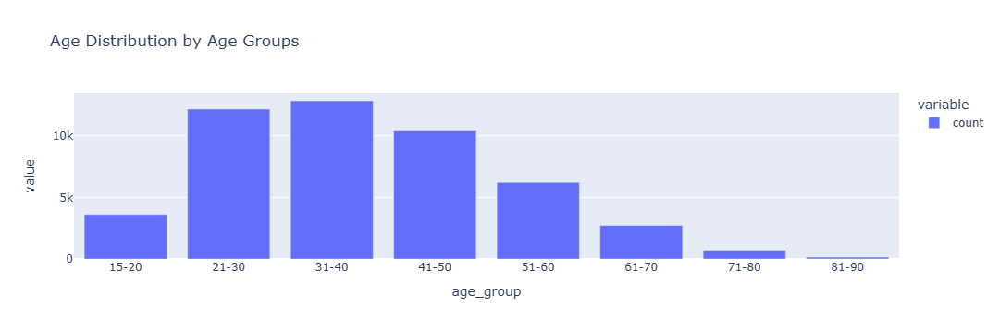

In [12]:
# Histogram
bins = [15, 20, 30, 40, 50, 60, 70, 80, 90]
labels = ['15-20','21-30','31-40','41-50','51-60','61-70','71-80','81-90']

df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, include_lowest=True)

fig = px.bar(
    df['age_group'].value_counts().sort_index(),
    title='Age Distribution by Age Groups'
)
fig.update_traces(hovertemplate='Age Group: %{x}<br>Count: %{y}')
fig.show()


#### The dataset is heavily concentrated in the 21–50 age range, with the highest representation in the 31–40 group. Both younger (15–20) and older (70+) age groups are underrepresented, indicating that the dataset primarily reflects working‑age adults.

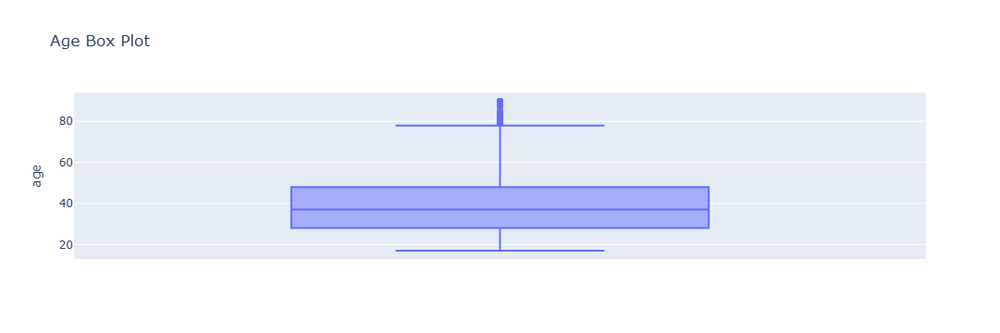

In [8]:
# Box plot
fig = px.box(df, y='age', title='Age Box Plot')
fig.show()


#### The age distribution is centered around 37 years, with most individuals between 28 and 48. The data shows a slight right skew due to older individuals (70–90), which appear as outliers. Overall, the distribution is clean, realistic, and consistent with a working‑age population.

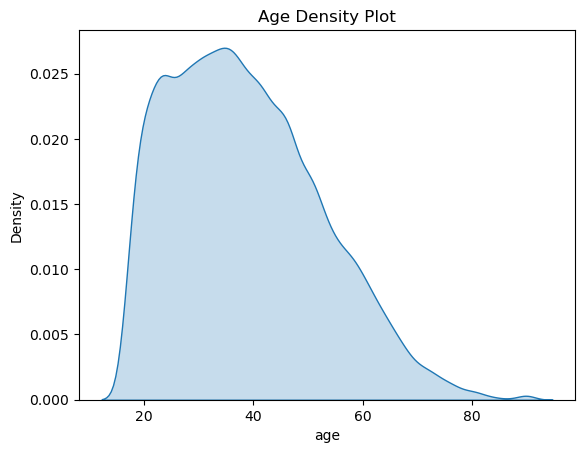

In [9]:
# Density plot
sns.kdeplot(df['age'], fill=True)
plt.title('Age Density Plot')
plt.show()


####  The age density plot shows a smooth, slightly right‑skewed distribution with the highest concentration of individuals between ages 30 and 40. Density declines steadily after age 50, with very few individuals above 70, indicating a typical working‑age population.

## The age variable shows a clean, slightly right‑skewed distribution centered around the mid‑30s, with most individuals between 28 and 48, a mode of 36, and only a small number of older outliers.


# 2. Workclass 

####    Variable Type:
####       Categorical

In [15]:
# Descriptive summary for categorical variable
print("Unique categories:", df['workclass'].nunique())
print("\nCategory counts:\n", df['workclass'].value_counts())
print("\nCategory percentages:\n", df['workclass'].value_counts(normalize=True) * 100)
print("Mode of workclass:", df['workclass'].mode()[0])



Unique categories: 9

Category counts:
 workclass
Private             33879
Self-emp-not-inc     3861
Local-gov            3136
Unknown              2799
State-gov            1981
Self-emp-inc         1694
Federal-gov          1432
Without-pay            21
Never-worked           10
Name: count, dtype: int64

Category percentages:
 workclass
Private             69.405691
Self-emp-not-inc     7.909778
Local-gov            6.424518
Unknown              5.734128
State-gov            4.058345
Self-emp-inc         3.470387
Federal-gov          2.933645
Without-pay          0.043021
Never-worked         0.020486
Name: proportion, dtype: float64
Mode of workclass: Private


#### The workclass variable is heavily skewed toward Private employment (69%), with government and self‑employment categories forming small secondary groups and two extremely rare categories (Without‑pay, Never‑worked) that contribute almost nothing to the dataset.

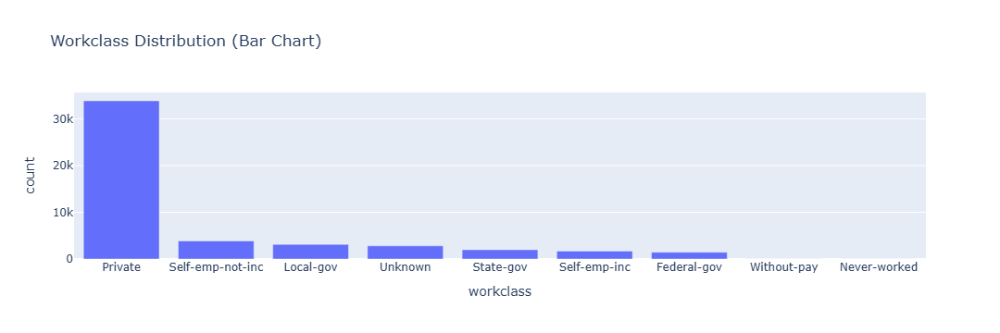

In [17]:
wc = df['workclass'].value_counts().reset_index()
wc.columns = ['workclass', 'count']

fig = px.bar(
    wc,
    x='workclass',
    y='count',
    title='Workclass Distribution (Bar Chart)'
)

fig.update_traces(hovertemplate='Workclass: %{x}<br>Count: %{y}')
fig.show()



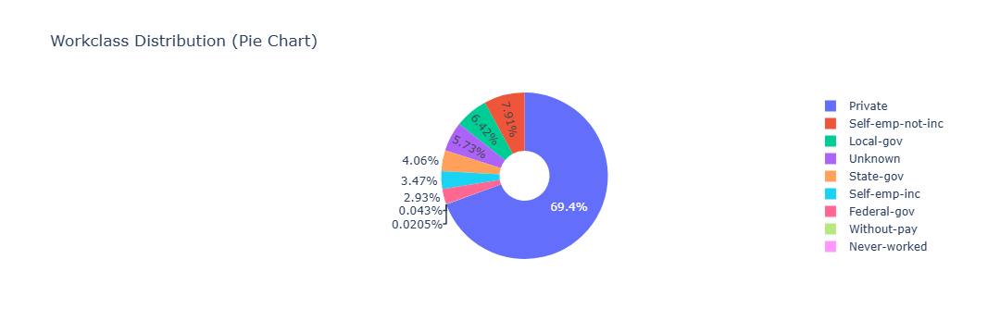

In [18]:
fig = px.pie(
    df,
    names='workclass',
    title='Workclass Distribution (Pie Chart)',
    hole=0.3  # optional donut style
)

fig.update_traces(hovertemplate='Workclass: %{label}<br>Percent: %{percent}')
fig.show()


In [19]:
df['workclass_grouped'] = df['workclass'].replace({
    'Federal-gov': 'Government',
    'State-gov': 'Government',
    'Local-gov': 'Government',
    'Self-emp-inc': 'Self-Employed',
    'Self-emp-not-inc': 'Self-Employed',
    'Without-pay': 'Not-Working',
    'Never-worked': 'Not-Working',
    'Unknown': 'Unknown',
    'Private': 'Private'
})


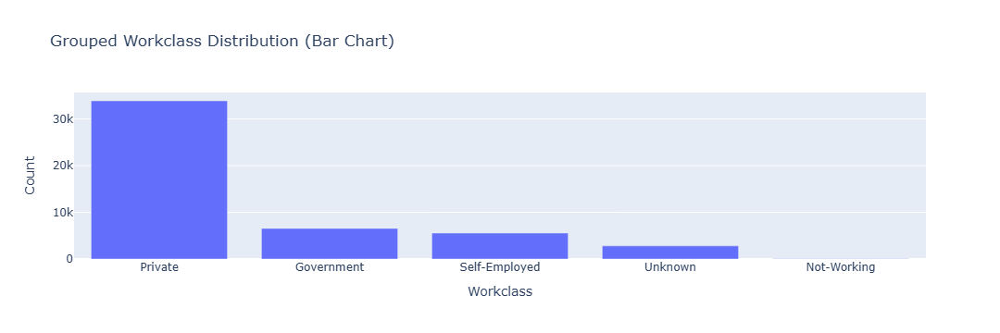

In [20]:
wc_grouped = df['workclass_grouped'].value_counts().reset_index()
wc_grouped.columns = ['workclass_grouped', 'count']

fig = px.bar(
    wc_grouped,
    x='workclass_grouped',
    y='count',
    title='Grouped Workclass Distribution (Bar Chart)',
    labels={'workclass_grouped': 'Workclass', 'count': 'Count'}
)

fig.update_traces(hovertemplate='Workclass: %{x}<br>Count: %{y}')
fig.show()


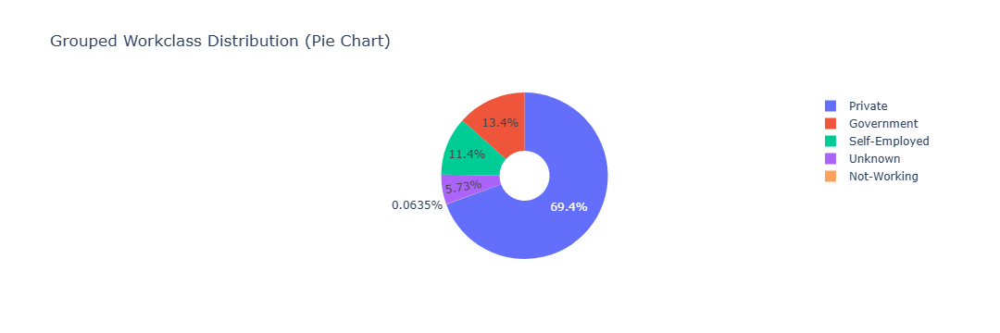

In [21]:
fig = px.pie(
    df,
    names='workclass_grouped',
    title='Grouped Workclass Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Workclass: %{label}<br>Percent: %{percent}')
fig.show()


# 3. fnlwgt
#### Variable Type:
  ####   Numeric(continuous)

In [22]:
print(df['fnlwgt'].describe())
print("Mode of fnlwgt:", df['fnlwgt'].mode()[0])


count    4.881300e+04
mean     1.896679e+05
std      1.056062e+05
min      1.228500e+04
25%      1.175550e+05
50%      1.781400e+05
75%      2.376200e+05
max      1.490400e+06
Name: fnlwgt, dtype: float64
Mode of fnlwgt: 203488


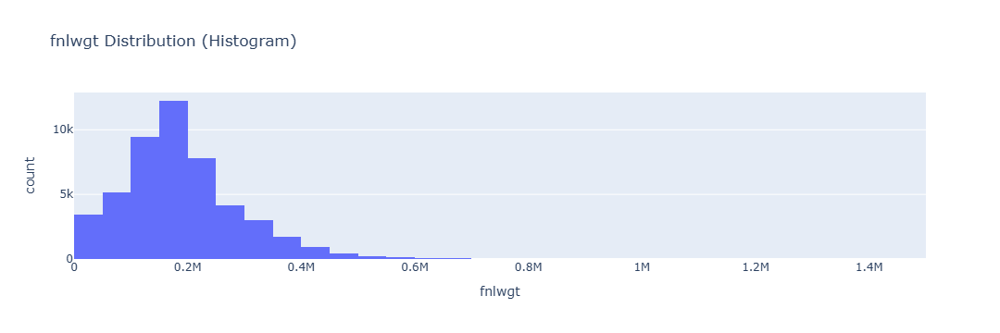

In [23]:
fig = px.histogram(
    df,
    x='fnlwgt',
    nbins=40,
    title='fnlwgt Distribution (Histogram)'
)
fig.update_traces(hovertemplate='fnlwgt: %{x}<br>Count: %{y}')
fig.show()


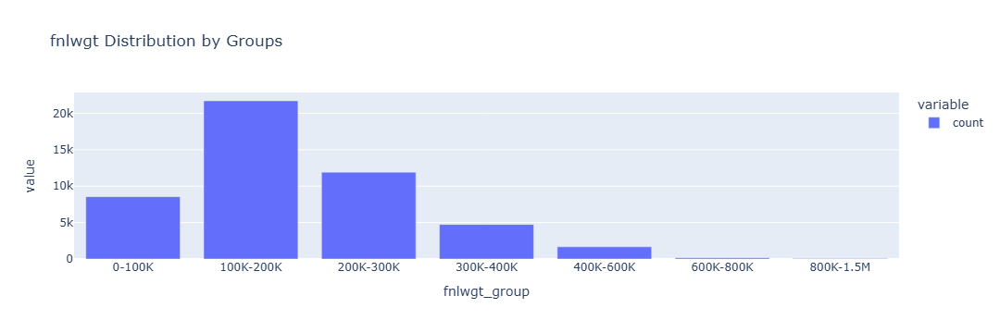

In [26]:
bins = [0, 100000, 200000, 300000, 400000, 600000, 800000, 1500000]
labels = [
    '0-100K', '100K-200K', '200K-300K', '300K-400K',
    '400K-600K', '600K-800K', '800K-1.5M'
]

df['fnlwgt_group'] = pd.cut(df['fnlwgt'], bins=bins, labels=labels, include_lowest=True)

fig = px.bar(
    df['fnlwgt_group'].value_counts().sort_index(),
    title='fnlwgt Distribution by Groups'
)
fig.update_traces(hovertemplate='Group: %{x}<br>Count: %{y}')
fig.show()


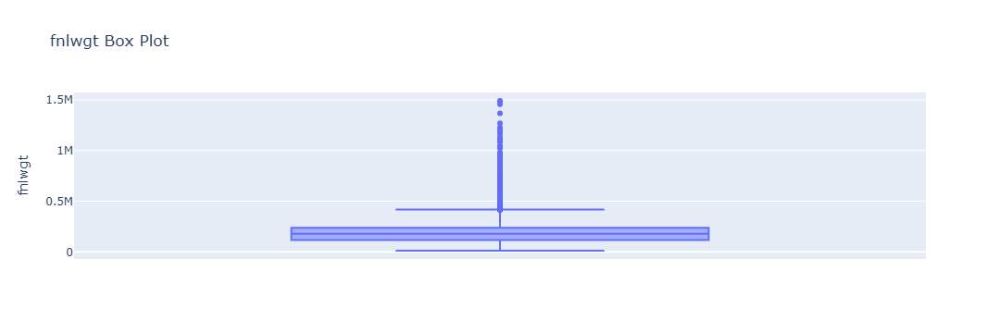

In [24]:
fig = px.box(
    df,
    y='fnlwgt',
    title='fnlwgt Box Plot'
)
fig.update_traces(hovertemplate='fnlwgt: %{y}')
fig.show()


# 4. Education
#### Variable Type:
#### Categorical


In [27]:
print("Unique categories:", df['education'].nunique())
print("\nCategory counts:\n", df['education'].value_counts())
print("\nCategory percentages:\n", df['education'].value_counts(normalize=True) * 100)


Unique categories: 16

Category counts:
 education
HS-grad         15777
Some-college    10869
Bachelors        8020
Masters          2656
Assoc-voc        2060
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           954
Prof-school       834
9th               756
12th              656
Doctorate         594
5th-6th           508
1st-4th           245
Preschool          82
Name: count, dtype: int64

Category percentages:
 education
HS-grad         32.321308
Some-college    22.266609
Bachelors       16.430049
Masters          5.441173
Assoc-voc        4.220187
11th             3.712126
Assoc-acdm       3.279864
10th             2.845553
7th-8th          1.954397
Prof-school      1.708561
9th              1.548768
12th             1.343904
Doctorate        1.216889
5th-6th          1.040706
1st-4th          0.501915
Preschool        0.167988
Name: proportion, dtype: float64


In [28]:
print("Mode of education:", df['education'].mode()[0])


Mode of education: HS-grad


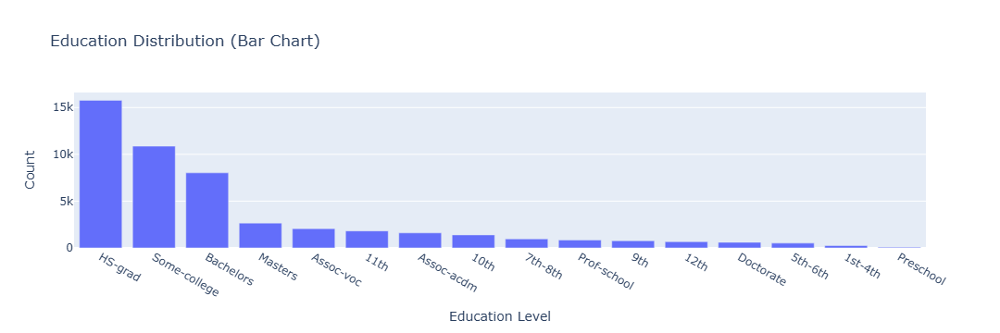

In [29]:
edu = df['education'].value_counts().reset_index()
edu.columns = ['education', 'count']

fig = px.bar(
    edu,
    x='education',
    y='count',
    title='Education Distribution (Bar Chart)',
    labels={'education': 'Education Level', 'count': 'Count'}
)

fig.update_traces(hovertemplate='Education: %{x}<br>Count: %{y}')
fig.show()


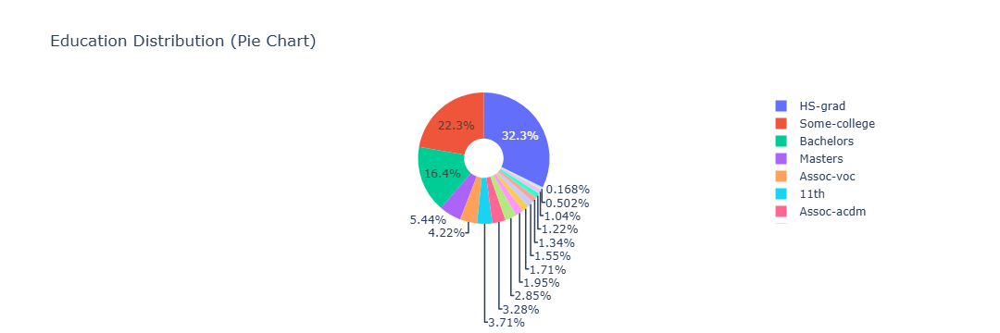

In [30]:
fig = px.pie(
    df,
    names='education',
    title='Education Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Education: %{label}<br>Percent: %{percent}')
fig.show()


In [31]:
df['education_grouped'] = df['education'].replace({
    'Preschool': 'Lower-Education',
    '1st-4th': 'Lower-Education',
    '5th-6th': 'Lower-Education',
    '7th-8th': 'Lower-Education',
    '9th': 'Lower-Education',
    '10th': 'Lower-Education',
    '11th': 'Lower-Education',
    '12th': 'Lower-Education',
    'HS-grad': 'High-School',
    'Some-college': 'Some-College',
    'Assoc-acdm': 'Associates',
    'Assoc-voc': 'Associates',
    'Bachelors': 'Bachelors',
    'Masters': 'Advanced-Degree',
    'Doctorate': 'Advanced-Degree',
    'Prof-school': 'Advanced-Degree'
})


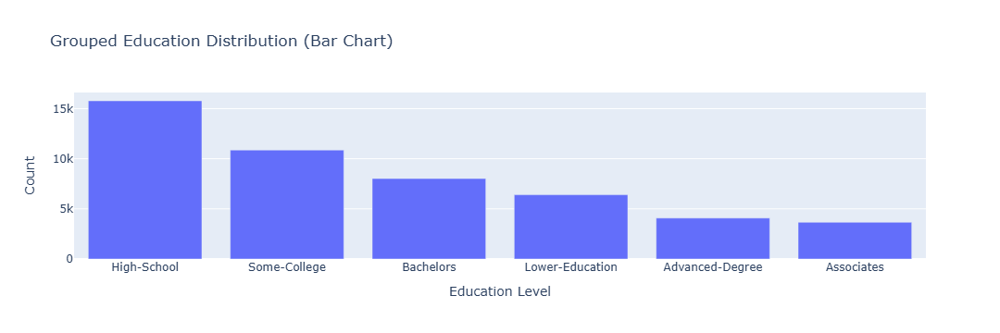

In [32]:
edu_grouped = df['education_grouped'].value_counts().reset_index()
edu_grouped.columns = ['education_grouped', 'count']

fig = px.bar(
    edu_grouped,
    x='education_grouped',
    y='count',
    title='Grouped Education Distribution (Bar Chart)',
    labels={'education_grouped': 'Education Level', 'count': 'Count'}
)

fig.update_traces(hovertemplate='Education: %{x}<br>Count: %{y}')
fig.show()


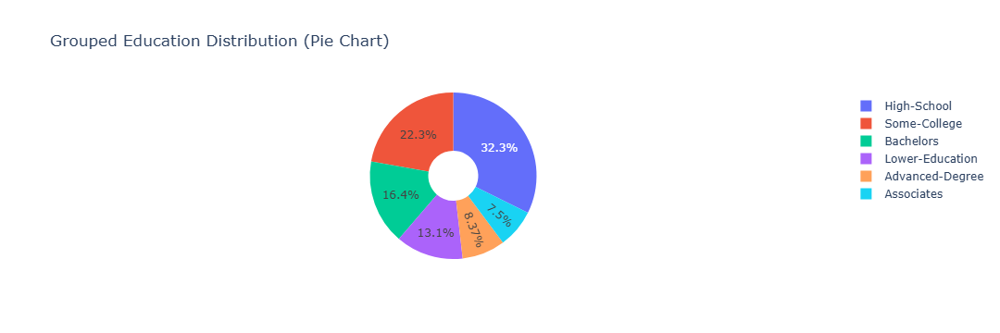

In [33]:
fig = px.pie(
    df,
    names='education_grouped',
    title='Grouped Education Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Education: %{label}<br>Percent: %{percent}')
fig.show()


#  5. Education_num
#### Variable Type:
#### ordinal

In [34]:
print(df['education_num'].describe())


count    48813.000000
mean        10.078688
std          2.570257
min          1.000000
25%          9.000000
50%         10.000000
75%         12.000000
max         16.000000
Name: education_num, dtype: float64


In [35]:
print("Mode of education_num:", df['education_num'].mode()[0])


Mode of education_num: 9


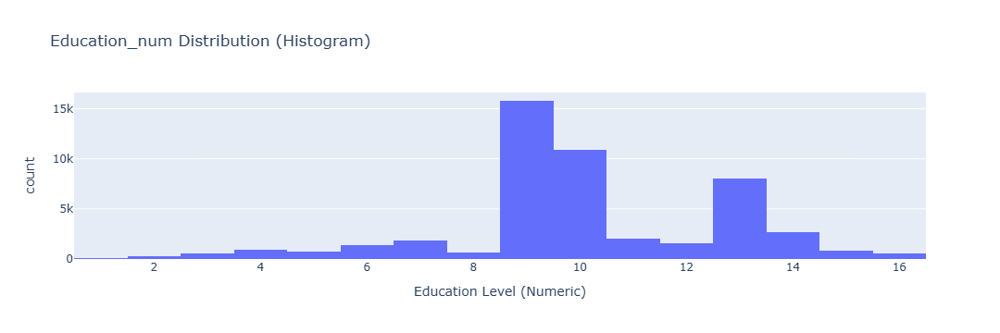

In [36]:
fig = px.histogram(
    df,
    x='education_num',
    nbins=16,
    title='Education_num Distribution (Histogram)',
    labels={'education_num': 'Education Level (Numeric)'}
)

fig.update_traces(hovertemplate='Education_num: %{x}<br>Count: %{y}')
fig.show()


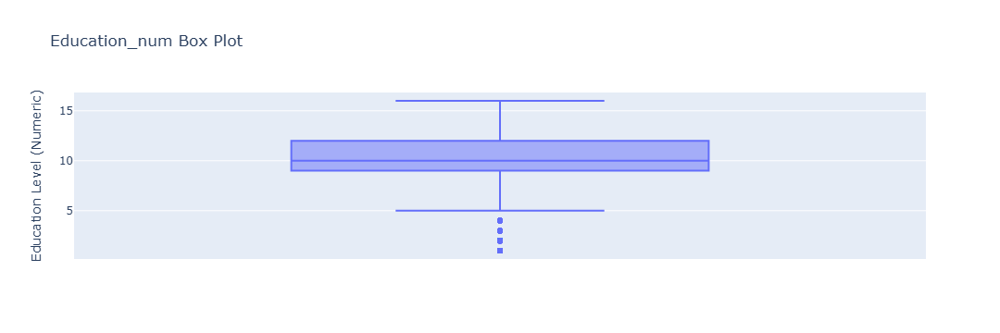

In [37]:
fig = px.box(
    df,
    y='education_num',
    title='Education_num Box Plot',
    labels={'education_num': 'Education Level (Numeric)'}
)

fig.update_traces(hovertemplate='Education_num: %{y}')
fig.show()


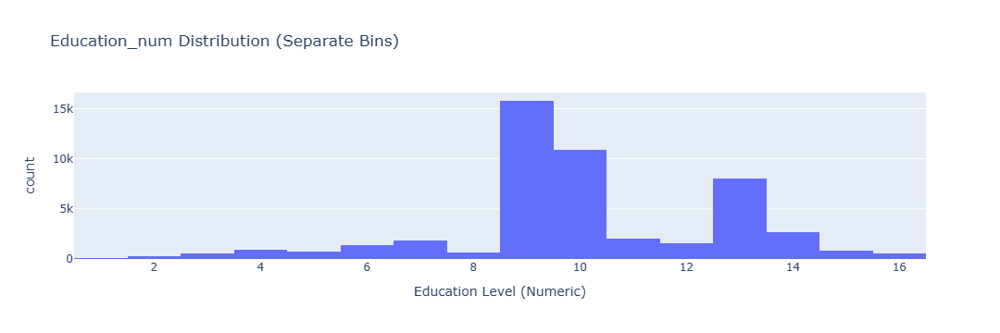

In [39]:
fig = px.histogram(
    df,
    x='education_num',
    nbins=16,
    title='Education_num Distribution (Separate Bins)',
    labels={'education_num': 'Education Level (Numeric)'}
)

fig.update_traces(hovertemplate='Education_num: %{x}<br>Count: %{y}')
fig.show()


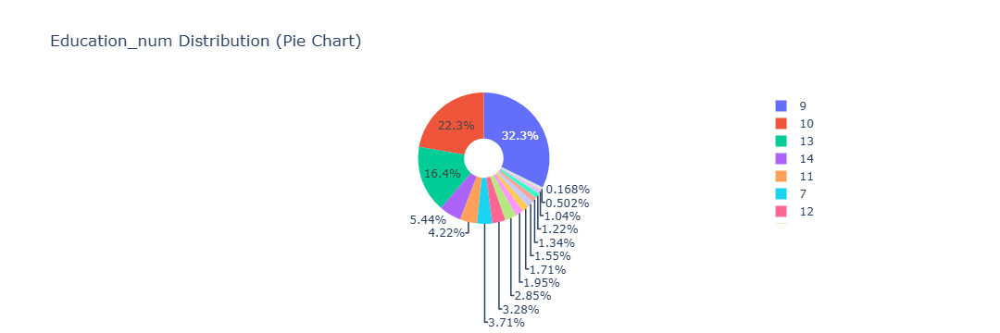

In [40]:
fig = px.pie(
    df,
    names='education_num',
    title='Education_num Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Education_num: %{label}<br>Percent: %{percent}')
fig.show()


In [41]:
df['education_num_grouped'] = pd.cut(
    df['education_num'],
    bins=[0, 8, 9, 10, 12, 13, 16],
    labels=[
        'Lower-Education',   # 1–8
        'High-School',       # 9
        'Some-College',      # 10
        'Associates',        # 11–12
        'Bachelors',         # 13
        'Advanced-Degree'    # 14–16
    ],
    include_lowest=True
)


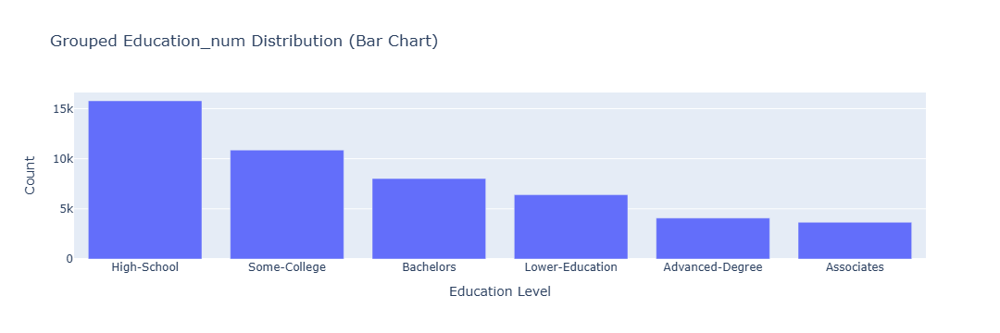

In [42]:
edu_grp = df['education_num_grouped'].value_counts().reset_index()
edu_grp.columns = ['education_grouped', 'count']

fig = px.bar(
    edu_grp,
    x='education_grouped',
    y='count',
    title='Grouped Education_num Distribution (Bar Chart)',
    labels={'education_grouped': 'Education Level', 'count': 'Count'}
)

fig.update_traces(hovertemplate='Education: %{x}<br>Count: %{y}')
fig.show()


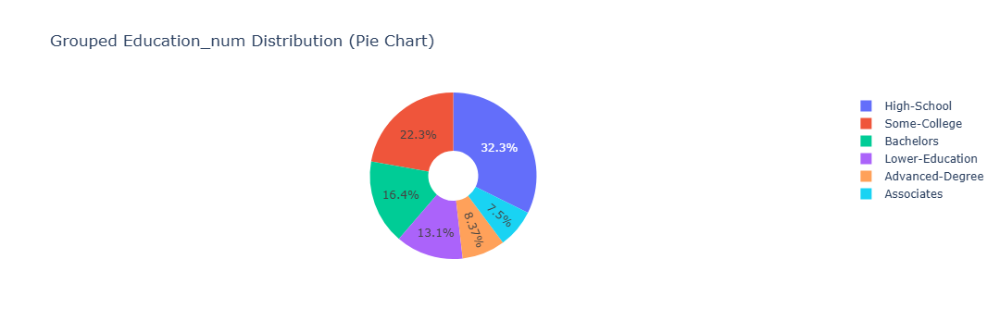

In [43]:
fig = px.pie(
    df,
    names='education_num_grouped',
    title='Grouped Education_num Distribution (Pie Chart)',
    hole=0.3
)

fig.update_traces(hovertemplate='Education: %{label}<br>Percent: %{percent}')
fig.show()


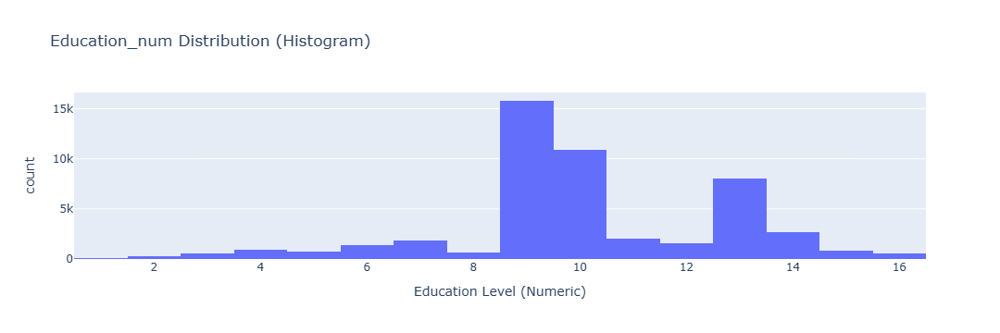

In [44]:
fig = px.histogram(
    df,
    x='education_num',
    nbins=16,
    title='Education_num Distribution (Histogram)',
    labels={'education_num': 'Education Level (Numeric)'}
)

fig.update_traces(hovertemplate='Education_num: %{x}<br>Count: %{y}')
fig.show()


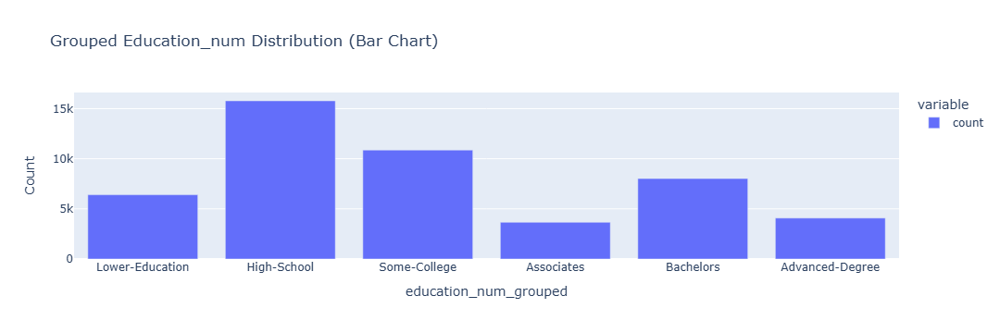

In [45]:
fig = px.bar(
    df['education_num_grouped'].value_counts().sort_index(),
    title='Grouped Education_num Distribution (Bar Chart)',
    labels={'index': 'Education Group', 'value': 'Count'}
)

fig.show()
